# Exploring precision and recall

The goal of this second notebook is to understand precision-recall in the context of classifiers.

 * Use Amazon review data in its entirety.
 * Train a logistic regression sntmntMdl.
 * Explore various evaluation metrics: accuracy, confusion matrix, precision, recall.
 * Explore how various metrics can be combined to produce a cost of making an error.
 * Explore precision and recall curves.
 
Because we are using the full Amazon review dataset (not a subset of words or reviews), in this assignment we return to using GraphLab Create for its efficiency. As usual, let's start by **firing up GraphLab Create**.

Make sure you have the latest version of GraphLab Create (1.8.3 or later). If you don't find the decision tree module, then you would need to upgrade graphlab-create using

```
   pip install graphlab-create --upgrade
```
See [this page](https://dato.com/download/) for detailed instructions on upgrading.

In [1]:
import graphlab as gl
print('gl.version: %s' % (gl.version))
gl.canvas.set_target('ipynb')

from __future__ import division
import math
import string

# my imports
import pandas as pd
import numpy as np
from six.moves import cPickle as pickle

gl.version: 1.8.5


In [39]:
from types import MethodType
def value_counts( self ):
    import pandas as pd
    pdDf = self.to_dataframe()
    for ftr in pdDf.columns:
        print(pdDf[ftr].value_counts())
        
#SFrame.value_counts = MethodType(value_counts, None, SFrame)
#setattr(SFrame, 'value_counts', value_counts)
#setattr(glbObsAll, 'value_counts', value_counts)

def SFrameShow( self , catClmn = None, title = None):
    if (title != None):
        print('%s Summary:' % (title))
    print(self.shape)
    self.show()
    if catClmn != None:
        for clmn in catClmn:
            print('  %s category summary:' % (clmn))
            glbObsAll[clmn].show(view = 'Categorical')

    print(self)

# Load amazon review dataset

In [2]:
glbObsAll = gl.SFrame('data/amazon_baby.gl/')

2016-03-18 10:31:47,514 [INFO] graphlab.cython.cy_server, 176: GraphLab Create v1.8.5 started. Logging: /tmp/graphlab_server_1458311505.log


This non-commercial license of GraphLab Create is assigned to bbalaji8@gmail.com and will expire on December 09, 2016. For commercial licensing options, visit https://dato.com/buy/.


In [4]:
print(glbObsAll.shape)
glbObsAll.show()
print(glbObsAll)

(183531, 3)


+-------------------------------+-------------------------------+--------+
|              name             |             review            | rating |
+-------------------------------+-------------------------------+--------+
|    Planetwise Flannel Wipes   | These flannel wipes are OK... |  3.0   |
|     Planetwise Wipe Pouch     | it came early and was not ... |  5.0   |
| Annas Dream Full Quilt wit... | Very soft and comfortable ... |  5.0   |
| Stop Pacifier Sucking with... | This is a product well wor... |  5.0   |
| Stop Pacifier Sucking with... | All of my kids have cried ... |  5.0   |
| Stop Pacifier Sucking with... | When the Binky Fairy came ... |  5.0   |
| A Tale of Baby's Days with... | Lovely book, it's bound ti... |  4.0   |
| Baby Tracker&reg; - Daily ... | Perfect for new parents. W... |  5.0   |
| Baby Tracker&reg; - Daily ... | A friend of mine pinned th... |  5.0   |
| Baby Tracker&reg; - Daily ... | This has been an easy way ... |  4.0   |
+------------------------

In [5]:
glbObsAll['rating'].show(view = 'Categorical')

# Extract word counts and sentiments

As in the first assignment of this course, we compute the word counts for individual words and extract positive and negative sentiments from ratings. To summarize, we perform the following:

1. Remove punctuation.
2. Remove reviews with "neutral" sentiment (rating 3).
3. Set reviews with rating 4 or more to be positive and those with 2 or less to be negative.

In [6]:
def rmvPunctuation(text):
    import string
    return text.translate(None, string.punctuation) 

# Remove punctuation.
glbObsAll['review.noPnct'] = glbObsAll['review'].apply(rmvPunctuation)

# Count words
glbObsAll['wrdsKnt'] = gl.text_analytics.count_words(glbObsAll['review.noPnct'])

# Drop neutral sentiment reviews.
glbObsAll = glbObsAll[glbObsAll['rating'] != 3]

# Positive sentiment to +1 and negative sentiment to -1
glbObsAll['sentiment'] = glbObsAll['rating'].apply(lambda rating : +1 if rating > 3 else -1)

Now, let's remember what the dataset looks like by taking a quick peek:

In [7]:
print(glbObsAll.shape)
glbObsAll.show()
glbObsAll['rating'].show(view = 'Categorical')
glbObsAll['sentiment'].show(view = 'Categorical')
print(glbObsAll)

(166752, 6)


+-------------------------------+-------------------------------+--------+
|              name             |             review            | rating |
+-------------------------------+-------------------------------+--------+
|     Planetwise Wipe Pouch     | it came early and was not ... |  5.0   |
| Annas Dream Full Quilt wit... | Very soft and comfortable ... |  5.0   |
| Stop Pacifier Sucking with... | This is a product well wor... |  5.0   |
| Stop Pacifier Sucking with... | All of my kids have cried ... |  5.0   |
| Stop Pacifier Sucking with... | When the Binky Fairy came ... |  5.0   |
| A Tale of Baby's Days with... | Lovely book, it's bound ti... |  4.0   |
| Baby Tracker&reg; - Daily ... | Perfect for new parents. W... |  5.0   |
| Baby Tracker&reg; - Daily ... | A friend of mine pinned th... |  5.0   |
| Baby Tracker&reg; - Daily ... | This has been an easy way ... |  4.0   |
| Baby Tracker&reg; - Daily ... | I love this journal and ou... |  4.0   |
+------------------------

## Split data into training and test sets

We split the data into a 80-20 split where 80% is in the training set and 20% is in the test set.

In [12]:
glbObsFit, glbObsOOB = glbObsAll.random_split(.8, seed=1)
SFrameShow(glbObsFit, catClmn = ['rating', 'sentiment'], title = 'glbObsFit')
SFrameShow(glbObsOOB, catClmn = ['rating', 'sentiment'], title = 'glbObsOOB')

glbObsFit Summary:
(133416, 6)


  rating category summary:


  sentiment category summary:


+-------------------------------+-------------------------------+--------+
|              name             |             review            | rating |
+-------------------------------+-------------------------------+--------+
|     Planetwise Wipe Pouch     | it came early and was not ... |  5.0   |
| Annas Dream Full Quilt wit... | Very soft and comfortable ... |  5.0   |
| Stop Pacifier Sucking with... | This is a product well wor... |  5.0   |
| Stop Pacifier Sucking with... | All of my kids have cried ... |  5.0   |
| Stop Pacifier Sucking with... | When the Binky Fairy came ... |  5.0   |
| A Tale of Baby's Days with... | Lovely book, it's bound ti... |  4.0   |
| Baby Tracker&reg; - Daily ... | Perfect for new parents. W... |  5.0   |
| Baby Tracker&reg; - Daily ... | A friend of mine pinned th... |  5.0   |
| Baby Tracker&reg; - Daily ... | This book is perfect!  I'm... |  5.0   |
| Baby Tracker&reg; - Daily ... | I originally just gave the... |  4.0   |
+------------------------

  rating category summary:


  sentiment category summary:


+-------------------------------+-------------------------------+--------+
|              name             |             review            | rating |
+-------------------------------+-------------------------------+--------+
| Baby Tracker&reg; - Daily ... | This has been an easy way ... |  4.0   |
| Baby Tracker&reg; - Daily ... | I love this journal and ou... |  4.0   |
| Nature's Lullabies First Y... | I love this little calende... |  5.0   |
| Nature's Lullabies Second ... | I had a hard time finding ... |  5.0   |
|  Lamaze Peekaboo, I Love You  | One of baby's first and fa... |  4.0   |
|  Lamaze Peekaboo, I Love You  | My son loved this book as ... |  5.0   |
|  Lamaze Peekaboo, I Love You  | Our baby loves this book &... |  5.0   |
| SoftPlay Giggle Jiggle Fun... | This bear is absolutely ad... |  2.0   |
| SoftPlay Peek-A-Boo Where'... | I bought two for recent ba... |  5.0   |
| Baby's First Year Undated ... | I searched high and low fo... |  5.0   |
+------------------------

## Train a logistic regression classifier

We will now train a logistic regression classifier with **sentiment** as the target and **word_count** as the features. We will set `validation_set=None` to make sure everyone gets exactly the same results.  

Remember, even though we now know how to implement logistic regression, we will use GraphLab Create for its efficiency at processing this Amazon dataset in its entirety.  The focus of this assignment is instead on the topic of precision and recall.

In [13]:
sntmntMdl = gl.logistic_classifier.create(glbObsFit, target='sentiment',
                                            features=['wrdsKnt'],
                                            validation_set=None)

Logistic regression:

--------------------------------------------------------

Number of examples          : 133416

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 121712

Number of coefficients    : 121713

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training-accuracy |

+-----------+----------+-----------+--------------+-------------------+

| 1         | 5        | 0.000002  | 2.145242     | 0.840754          |

| 2         | 9        | 3.000000  | 3.101477     | 0.931350          |

| 3         | 10       | 3.000000  | 3.439952     | 0.882046          |

| 4         | 11       | 3.000000  | 3.791295     | 0.954076          |

| 5         | 12       | 3.000000  | 4.121107     | 0.960964          |

| 6         | 13       | 3.000000  | 4.454746     | 0.975033          |

+-----------+----------+-----------+--------------+-------------------+

TERMINATED: Terminated due to numerical difficulties.

This model may not be ideal. To improve it, consider doing one of the following:
(a) Increasing the regularization.
(b) Standardizing the input data.
(c) Removing highly correlated features.
(d) Removing `inf` and `NaN` values in the training data.

# sntmntMdl Evaluation

We will explore the advanced sntmntMdl evaluation concepts that were discussed in the lectures.

## Accuracy

One performance metric we will use for our more advanced exploration is accuracy, which we have seen many times in past assignments.  Recall that the accuracy is given by

$$
\mbox{accuracy} = \frac{\mbox{# correctly classified data points}}{\mbox{# total data points}}
$$

To obtain the accuracy of our trained sntmntMdls using GraphLab Create, simply pass the option `metric='accuracy'` to the `evaluate` function. We compute the **accuracy** of our logistic regression sntmntMdl on the **glbObsOOB** as follows:

In [14]:
sntmntMdlAccuracy = sntmntMdl.evaluate(glbObsOOB, metric='accuracy')['accuracy']
print "Test Accuracy: %s" % sntmntMdlAccuracy

Test Accuracy: 0.914536837053


## Baseline: Majority class prediction

Recall from an earlier assignment that we used the **majority class classifier** as a baseline (i.e reference) sntmntMdl for a point of comparison with a more sophisticated classifier. The majority classifier sntmntMdl predicts the majority class for all data points. 

Typically, a good sntmntMdl should beat the majority class classifier. Since the majority class in this dataset is the positive class (i.e., there are more positive than negative reviews), the accuracy of the majority class classifier can be computed as follows:

In [15]:
baselineAccuracy = len(glbObsOOB[glbObsOOB['sentiment'] == +1])/len(glbObsOOB)
print "Baseline accuracy (majority class classifier): %s" % baselineAccuracy

Baseline accuracy (majority class classifier): 0.842782577394


** Quiz Question:** Using accuracy as the evaluation metric, was our **logistic regression sntmntMdl** better than the baseline (majority class classifier)?

## Confusion Matrix

The accuracy, while convenient, does not tell the whole story. For a fuller picture, we turn to the **confusion matrix**. In the case of binary classification, the confusion matrix is a 2-by-2 matrix laying out correct and incorrect predictions made in each label as follows:
```
              +---------------------------------------------+
              |                Predicted label              |
              +----------------------+----------------------+
              |          (+1)        |         (-1)         |
+-------+-----+----------------------+----------------------+
| True  |(+1) | # of true positives  | # of false negatives |
| label +-----+----------------------+----------------------+
|       |(-1) | # of false positives | # of true negatives  |
+-------+-----+----------------------+----------------------+
```
To print out the confusion matrix for a classifier, use `metric='confusion_matrix'`:

In [16]:
sntmntMdlCnfsnMtrx = sntmntMdl.evaluate(glbObsOOB, metric='confusion_matrix')['confusion_matrix']
sntmntMdlCnfsnMtrx

target_label,predicted_label,count
1,-1,1406
-1,-1,3798
-1,1,1443
1,1,26689


**Quiz Question**: How many predicted values in the **test set** are **false positives**?

## Computing the cost of mistakes


Put yourself in the shoes of a manufacturer that sells a baby product on Amazon.com and you want to monitor your product's reviews in order to respond to complaints.  Even a few negative reviews may generate a lot of bad publicity about the product. So you don't want to miss any reviews with negative sentiments --- you'd rather put up with false alarms about potentially negative reviews instead of missing negative reviews entirely. In other words, **false positives cost more than false negatives**. (It may be the other way around for other scenarios, but let's stick with the manufacturer's scenario for now.)

Suppose you know the costs involved in each kind of mistake: 
1. \$100 for each false positive.
2. \$1 for each false negative.
3. Correctly classified reviews incur no cost.

**Quiz Question**: Given the stipulation, what is the cost associated with the logistic regression classifier's performance on the **test set**?

In [20]:
sntmntMdlCost = sntmntMdlCnfsnMtrx[(sntmntMdlCnfsnMtrx[   'target_label'] == -1) & 
                                   (sntmntMdlCnfsnMtrx['predicted_label'] == +1)]['count'] * \
                100 + \
                sntmntMdlCnfsnMtrx[(sntmntMdlCnfsnMtrx[   'target_label'] == +1) & 
                                   (sntmntMdlCnfsnMtrx['predicted_label'] == -1)]['count'] * \
                1   + \
                0
print(sntmntMdlCost)                

[145706]


## Precision and Recall

You may not have exact dollar amounts for each kind of mistake. Instead, you may simply prefer to reduce the percentage of false positives to be less than, say, 3.5% of all positive predictions. This is where **precision** comes in:

$$
[\text{precision}] = \frac{[\text{# positive data points with positive predicitions}]}{\text{[# all data points with positive predictions]}} = \frac{[\text{# true positives}]}{[\text{# true positives}] + [\text{# false positives}]}
$$

So to keep the percentage of false positives below 3.5% of positive predictions, we must raise the precision to 96.5% or higher. 

**First**, let us compute the precision of the logistic regression classifier on the **glbObsOOB**.

In [21]:
sntmntMdlPrecision = sntmntMdl.evaluate(glbObsOOB, metric='precision')['precision']
print "Precision on test data: %s" % sntmntMdlPrecision

Precision on test data: 0.948706099815


**Quiz Question**: Out of all reviews in the **test set** that are predicted to be positive, what fraction of them are **false positives**? (Round to the second decimal place e.g. 0.25)

In [22]:
print "FP/(FP+TP) on test data: %.2f" % (1 - sntmntMdlPrecision)

FP/(FP+TP) on test data: 0.05


**Quiz Question:** Based on what we learned in lecture, if we wanted to reduce this fraction of false positives to be below 3.5%, we would: (see the quiz)

A complementary metric is **recall**, which measures the ratio between the number of true positives and that of (ground-truth) positive reviews:

$$
[\text{recall}] = \frac{[\text{# positive data points with positive predicitions}]}{\text{[# all positive data points]}} = \frac{[\text{# true positives}]}{[\text{# true positives}] + [\text{# false negatives}]}
$$

Let us compute the recall on the **glbObsOOB**.

In [23]:
sntmntMdlRecall = sntmntMdl.evaluate(glbObsOOB, metric='recall')['recall']
print "Recall on test data: %s" % sntmntMdlRecall

Recall on test data: 0.949955508098


**Quiz Question**: What fraction of the positive reviews in the **test_set** were correctly predicted as positive by the classifier?

**Quiz Question**: What is the recall value for a classifier that predicts **+1** for all data points in the **glbObsOOB**?

In [24]:
baselineRecall = 1.0
print "Baseline recall (majority class classifier): %s" % baselineRecall

Baseline recall (majority class classifier): 1.0


# Precision-recall tradeoff

In this part, we will explore the trade-off between precision and recall discussed in the lecture.  We first examine what happens when we use a different threshold value for making class predictions.  We then explore a range of threshold values and plot the associated precision-recall curve.  


## Varying the threshold

False positives are costly in our example, so we may want to be more conservative about making positive predictions. To achieve this, instead of thresholding class probabilities at 0.5, we can choose a higher threshold. 

Write a function called `predictWthThreshold` that accepts two things
* `probabilities` (an SArray of probability values)
* `threshold` (a float between 0 and 1).

The function should return an array, where each element is set to +1 or -1 depending whether the corresponding probability exceeds `threshold`.

In [25]:
def predictWthThreshold(probabilities, threshold):
    ### YOUR CODE GOES HERE
    # +1 if >= threshold and -1 otherwise.
    return(probabilities.apply(lambda prby: +1 if prby >= threshold else -1))  

Run prediction with `output_type='probability'` to get the list of probability values. Then use thresholds set at 0.5 (default) and 0.9 to make predictions from these probability values.

In [27]:
glbObsOOB['sentiment' + '.PPrby'] = sntmntMdl.predict(glbObsOOB, output_type='probability')
glbObsOOB['sentiment' + '.PThrDfl'] = predictWthThreshold(glbObsOOB['sentiment' + '.PPrby'], 0.5)
glbObsOOB['sentiment' + '.PThrHgh'] = predictWthThreshold(glbObsOOB['sentiment' + '.PPrby'], 0.9)

In [29]:
print "Number of positive predicted reviews (threshold = 0.5): %s" % \
    (glbObsOOB['sentiment' + '.PThrDfl'] == 1).sum()
print "Number of positive predicted reviews (threshold = 0.9): %s" % \
    (glbObsOOB['sentiment' + '.PThrHgh'] == 1).sum()    

Number of positive predicted reviews (threshold = 0.5): 28132
Number of positive predicted reviews (threshold = 0.9): 25630


In [30]:
#print "Number of positive predicted reviews (threshold = 0.9): %s" % (glbObsOOB['sentiment' + '.PThrHgh'] == 1).sum()

**Quiz Question**: What happens to the number of positive predicted reviews as the threshold increased from 0.5 to 0.9?

## Exploring the associated precision and recall as the threshold varies

By changing the probability threshold, it is possible to influence precision and recall. We can explore this as follows:

In [31]:
# Threshold = 0.5
thrDflPrecision = gl.evaluation.precision(glbObsOOB['sentiment'],
                                        glbObsOOB['sentiment' + '.PThrDfl'])

thrDflRecall    = gl.evaluation.recall(glbObsOOB['sentiment'],
                                        glbObsOOB['sentiment' + '.PThrDfl'])

# Threshold = 0.9
thrHghPrecision = gl.evaluation.precision(glbObsOOB['sentiment'],
                                        glbObsOOB['sentiment' + '.PThrHgh'])
thrHghRecall    = gl.evaluation.recall(glbObsOOB['sentiment'],
                                        glbObsOOB['sentiment' + '.PThrHgh'])

In [32]:
print "Precision (threshold = 0.5): %s" % thrDflPrecision
print "Recall (threshold = 0.5)   : %s" % thrDflRecall

Precision (threshold = 0.5): 0.948706099815
Recall (threshold = 0.5)   : 0.949955508098


In [33]:
print "Precision (threshold = 0.9): %s" % thrHghPrecision
print "Recall (threshold = 0.9)   : %s" % thrHghRecall

Precision (threshold = 0.9): 0.969527896996
Recall (threshold = 0.9)   : 0.884463427656


**Quiz Question (variant 1)**: Does the **precision** increase with a higher threshold?

**Quiz Question (variant 2)**: Does the **recall** increase with a higher threshold?

## Precision-recall curve

Now, we will explore various different values of tresholds, compute the precision and recall scores, and then plot the precision-recall curve.

In [34]:
thrSearch = np.linspace(0.5, 1, num=100)
print thrSearch

[ 0.5         0.50505051  0.51010101  0.51515152  0.52020202  0.52525253
  0.53030303  0.53535354  0.54040404  0.54545455  0.55050505  0.55555556
  0.56060606  0.56565657  0.57070707  0.57575758  0.58080808  0.58585859
  0.59090909  0.5959596   0.6010101   0.60606061  0.61111111  0.61616162
  0.62121212  0.62626263  0.63131313  0.63636364  0.64141414  0.64646465
  0.65151515  0.65656566  0.66161616  0.66666667  0.67171717  0.67676768
  0.68181818  0.68686869  0.69191919  0.6969697   0.7020202   0.70707071
  0.71212121  0.71717172  0.72222222  0.72727273  0.73232323  0.73737374
  0.74242424  0.74747475  0.75252525  0.75757576  0.76262626  0.76767677
  0.77272727  0.77777778  0.78282828  0.78787879  0.79292929  0.7979798
  0.8030303   0.80808081  0.81313131  0.81818182  0.82323232  0.82828283
  0.83333333  0.83838384  0.84343434  0.84848485  0.85353535  0.85858586
  0.86363636  0.86868687  0.87373737  0.87878788  0.88383838  0.88888889
  0.89393939  0.8989899   0.9040404   0.90909091  0.

For each of the values of threshold, we compute the precision and recall scores.

In [35]:
thrPrcsn = []
thrRecll = []

#probabilities = sntmntMdl.predict(glbObsOOB, output_type='probability')
for threshold in thrSearch:
    predictions = predictWthThreshold(glbObsOOB['sentiment' + '.PPrby'], threshold)
    thrPrcsn.append(gl.evaluation.precision(glbObsOOB['sentiment'], predictions))
    thrRecll.append(gl.evaluation.recall   (glbObsOOB['sentiment'], predictions))

Now, let's plot the precision-recall curve to visualize the precision-recall tradeoff as we vary the threshold.

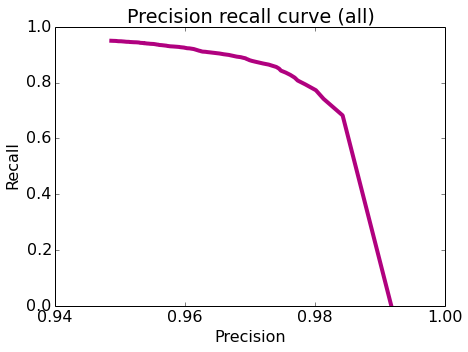

In [36]:
import matplotlib.pyplot as plt
%matplotlib inline

def pltClassifierPrecsionRecallCurve(precision, recall, title):
    plt.rcParams['figure.figsize'] = 7, 5
    plt.locator_params(axis = 'x', nbins = 5)
    plt.plot(precision, recall, 'b-', linewidth=4.0, color = '#B0017F')
    plt.title(title)
    plt.xlabel('Precision')
    plt.ylabel('Recall')
    plt.rcParams.update({'font.size': 16})
    
pltClassifierPrecsionRecallCurve(thrPrcsn, thrRecll, 'Precision recall curve (all)')

In [42]:
thresholds = gl.SFrame({'recall'    : thrRecll,
                        'precision' : thrPrcsn,        
                        'threshold' : thrSearch})
thresholds = thresholds[['threshold', 'precision', 'recall']]
SFrameShow(thresholds, title = 'thresholds')                        

thresholds Summary:
(100, 3)


+----------------+----------------+----------------+
|   threshold    |   precision    |     recall     |
+----------------+----------------+----------------+
|      0.5       | 0.948706099815 | 0.949955508098 |
| 0.505050505051 | 0.94905908719  | 0.949599572878 |
| 0.510101010101 | 0.949288256228 | 0.94945719879  |
| 0.515151515152 | 0.949506819072 | 0.94910126357  |
| 0.520202020202 | 0.949624140511 | 0.94874532835  |
| 0.525252525253 | 0.949805711026 | 0.948318206086 |
| 0.530303030303 | 0.950203324534 | 0.948140238477 |
| 0.535353535354 | 0.950417648319 | 0.947677522691 |
| 0.540404040404 | 0.950696677385 | 0.947143619861 |
| 0.545454545455 | 0.950877694755 | 0.946680904075 |
+----------------+----------------+----------------+
[100 rows x 3 columns]
Note: Only the head of the SFrame is printed.
You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.


**Quiz Question**: Among all the threshold values tried, what is the **smallest** threshold value that achieves a precision of 96.5% or better? Round your answer to 3 decimal places.

In [54]:
print(thresholds[thresholds['precision'] >= 0.965].sort('threshold'))
#print(thresholds[thresholds['precision'] >= 0.965].topk('threshold', k = 1, reverse = True))
print('smallest threshold: %.3f' % 
      thresholds[thresholds['precision'] >= 0.965].topk('threshold', k = 1, 
                                                        reverse = True)['threshold'][0])

+----------------+----------------+----------------+
|   threshold    |   precision    |     recall     |
+----------------+----------------+----------------+
| 0.838383838384 | 0.965311550152 | 0.90432461292  |
| 0.843434343434 | 0.965662948723 | 0.902900872041 |
| 0.848484848485 | 0.965982762566 | 0.901583911728 |
| 0.853535353535 | 0.966381418093 | 0.900373731981 |
| 0.858585858586 | 0.966780205901 | 0.899127958712 |
| 0.863636363636 | 0.966996320147 | 0.897917778964 |
| 0.868686868687 | 0.96737626806  | 0.896066915821 |
| 0.873737373737 | 0.96765996766  | 0.89460758142  |
| 0.878787878788 | 0.967978395062 | 0.893041466453 |
| 0.883838383838 | 0.968586792526 | 0.891155009788 |
+----------------+----------------+----------------+
[33 rows x 3 columns]
Note: Only the head of the SFrame is printed.
You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.
smallest threshold: 0.838


**Quiz Question**: Using `threshold` = 0.98, how many **false negatives** do we get on the **glbObsOOB**? (**Hint**: You may use the `gl.evaluation.confusion_matrix` function implemented in GraphLab Create.)

In [57]:
print(gl.evaluation.confusion_matrix(glbObsOOB['sentiment'], 
                    predictWthThreshold(glbObsOOB['sentiment' + '.PPrby'], threshold = 0.98)))

+--------------+-----------------+-------+
| target_label | predicted_label | count |
+--------------+-----------------+-------+
|      -1      |        1        |  487  |
|      1       |        1        | 22269 |
|      1       |        -1       |  5826 |
|      -1      |        -1       |  4754 |
+--------------+-----------------+-------+
[4 rows x 3 columns]



This is the number of false negatives (i.e the number of reviews to look at when not needed) that we have to deal with using this classifier.

# Evaluating specific search terms

So far, we looked at the number of false positives for the **entire test set**. In this section, let's select reviews using a specific search term and optimize the precision on these reviews only. After all, a manufacturer would be interested in tuning the false positive rate just for their products (the reviews they want to read) rather than that of the entire set of products on Amazon.

## Precision-Recall on all baby related items

From the **test set**, select all the reviews for all products with the word 'baby' in them.

In [58]:
bbyObsOOB =  glbObsOOB[glbObsOOB['name'].apply(lambda x: 'baby' in x.lower())]

In [59]:
SFrameShow(bbyObsOOB)

(6611, 9)


+-------------------------------+-------------------------------+--------+
|              name             |             review            | rating |
+-------------------------------+-------------------------------+--------+
| Baby Tracker&reg; - Daily ... | This has been an easy way ... |  4.0   |
| Baby Tracker&reg; - Daily ... | I love this journal and ou... |  4.0   |
| Baby's First Year Undated ... | I searched high and low fo... |  5.0   |
|   Our Baby Girl Memory Book   | Absolutely love it and all... |  5.0   |
| Newborn Baby Tracker&reg; ... | This is the best way to ke... |  5.0   |
| Large Jungle Animals (Pand... | I ordered these for my 7 m... |  5.0   |
| Sassy Who Loves Baby? Phot... | I bought this for a new gr... |  5.0   |
| Sassy Who Loves Baby? Phot... | I originally bought this f... |  5.0   |
| Crown Crafts The Original ... | This is a great product bu... |  1.0   |
| Crown Crafts The Original ... | I used this sling for both... |  5.0   |
+------------------------

Now, let's predict the probability of classifying these reviews as positive:

In [60]:
#probabilities = sntmntMdl.predict(bbyObsOOB, output_type='probability')

Let's plot the precision-recall curve for the **bbyObsOOB** dataset.

**First**, let's consider the following `thrSearch` ranging from 0.5 to 1:

In [63]:
thrBbySearch = np.linspace(0.5, 1, num=100)

**Second**, as we did above, let's compute precision and recall for each value in `thrSearch` on the **bbyObsOOB** dataset.  Complete the code block below.

In [64]:
thrBbyPrcsn = []
thrBbyRecll = []

for threshold in thrBbySearch:
    
    # Make predictions. Use the `predictWthThreshold` function 
    ## YOUR CODE HERE 
    predictions = predictWthThreshold(bbyObsOOB['sentiment' + '.PPrby'], threshold)

    # Calculate the precision.
    # YOUR CODE HERE
    #precision = ...
    
    # YOUR CODE HERE
    #recall = ...
    
    # Append the precision and recall scores.
    thrBbyPrcsn.append(gl.evaluation.precision(bbyObsOOB['sentiment'], predictions))
    thrBbyRecll.append(gl.evaluation.recall   (bbyObsOOB['sentiment'], predictions))

**Quiz Question**: Among all the threshold values tried, what is the **smallest** threshold value that achieves a precision of 96.5% or better for the reviews of data in **bbyObsOOB**? Round your answer to 3 decimal places.

In [65]:
bbyThresholds = gl.SFrame({'recall'    : thrBbyRecll,
                           'precision' : thrBbyPrcsn,        
                           'threshold' : thrBbySearch})
bbyThresholds = bbyThresholds[['threshold', 'precision', 'recall']]
SFrameShow(bbyThresholds, title = 'bbyThresholds')                        

bbyThresholds Summary:
(100, 3)


+----------------+----------------+----------------+
|   threshold    |   precision    |     recall     |
+----------------+----------------+----------------+
|      0.5       | 0.947656392486 | 0.944555535357 |
| 0.505050505051 | 0.948165723672 | 0.944373750227 |
| 0.510101010101 | 0.948319941563 | 0.944010179967 |
| 0.515151515152 | 0.948474328522 | 0.943646609707 |
| 0.520202020202 | 0.948638274538 | 0.943464824577 |
| 0.525252525253 | 0.948792977323 | 0.943101254317 |
| 0.530303030303 | 0.949487554905 | 0.943101254317 |
| 0.535353535354 | 0.949459805896 | 0.942555898927 |
| 0.540404040404 | 0.94998167827  | 0.942555898927 |
| 0.545454545455 | 0.949954170486 | 0.942010543538 |
+----------------+----------------+----------------+
[100 rows x 3 columns]
Note: Only the head of the SFrame is printed.
You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.


In [66]:
print(bbyThresholds[bbyThresholds['precision'] >= 0.965].sort('threshold'))
print('smallest threshold: %.3f' % 
      bbyThresholds[bbyThresholds['precision'] >= 0.965].topk('threshold', k = 1, 
                                                        reverse = True)['threshold'][0])

+----------------+----------------+----------------+
|   threshold    |   precision    |     recall     |
+----------------+----------------+----------------+
| 0.863636363636 | 0.965019762846 | 0.887656789675 |
| 0.868686868687 | 0.965510406343 | 0.885475368115 |
| 0.873737373737 | 0.966037735849 | 0.884202872205 |
| 0.878787878788 | 0.966155683854 | 0.882203235775 |
| 0.883838383838 | 0.966839792249 | 0.879840029086 |
| 0.888888888889 | 0.967935871743 | 0.878022177786 |
| 0.893939393939 | 0.968072289157 | 0.876386111616 |
| 0.89898989899  | 0.968014484007 | 0.874750045446 |
| 0.90404040404  | 0.967911200807 | 0.871841483367 |
| 0.909090909091 | 0.967859308672 | 0.870387202327 |
+----------------+----------------+----------------+
[28 rows x 3 columns]
Note: Only the head of the SFrame is printed.
You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.
smallest threshold: 0.864


**Quiz Question:** Is this threshold value smaller or larger than the threshold used for the entire dataset to achieve the same specified precision of 96.5%?

**Finally**, let's plot the precision recall curve.

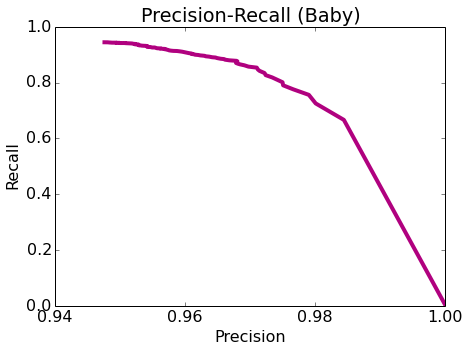

In [67]:
pltClassifierPrecsionRecallCurve(thrBbyPrcsn, thrBbyRecll, "Precision-Recall (Baby)")